<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/AI_Chips%2C_Energy_%26_Nuclear_Index_(2026)_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AI Chips, Energy & Nuclear Index (2026) Dataset

# The AI-Energy Nexus: A Quantitative Market Analysis (2020–2026)

**Project Overview** This project explores the critical intersection between the exponential growth of Artificial Intelligence (AI) and the physical energy infrastructure required to sustain it. Using a financial dataset covering key equities in Semiconductors, Renewable Energy, and Nuclear Power, the analysis quantifies the market's pricing of the "Energy Crunch" thesis.

**Key Findings**

1. **Sector Efficiency**: Through risk-adjusted return analysis (Sharpe Ratio), we identified that while AI Hardware (e.g., NVIDIA) offered the highest absolute returns, the Nuclear Energy sector provided superior stability, acting as a "defensive growth" asset. This confirms the market's rotation into nuclear as a reliable baseload power source for data centers.

2. **Correlation Dynamics**: The network analysis revealed a decoupling effect. Historically, Tech and Energy were inversely correlated. However, post-2023, the correlation between Semiconductor Manufacturers and Utility Providers has strengthened, suggesting the market now views them as a singular, symbiotic trade.

3. **Future Demand**: Time-series forecasting (Holt-Winters) predicts a continued breakout in the Nuclear index, driven by the widening gap between AI compute demand and available grid capacity.

**Strategic Implications** The Portfolio Optimization model demonstrates that a diversified basket—weighted approximately 40% AI / 30% Nuclear / 30% Renewables—yields the optimal Sharpe Ratio. This suggests that the "picks and shovels" play of the next decade is not just buying chips, but buying the power plants that run them.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d kanchana1990/ai-chips-energy-and-nuclear-index-2026

# Unziping the downloaded file
!unzip ai-chips-energy-and-nuclear-index-2026.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/kanchana1990/ai-chips-energy-and-nuclear-index-2026
License(s): apache-2.0
  0% 0.00/1.64M [00:00<?, ?B/s]
100% 1.64M/1.64M [00:00<00:00, 720MB/s]
Archive:  ai-chips-energy-and-nuclear-index-2026.zip
  inflating: AI_Economy_Complete_Index.csv  


In [3]:
df = pd.read_csv('AI_Economy_Complete_Index.csv')
df.head(11)

,Date,Ticker,Sector,Industry,Role,Close,Volume,Daily_Turnover,Log_Returns,Volatility_20d,RSI_14,SMA_50,SMA_200
0,2020-10-15,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.9267,267224000,3.721551e+09,-0.0089,0.3765,67.3471,12.7260,8.9561
1,2020-10-16,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.7687,242392000,3.337423e+09,-0.0114,0.3677,62.2981,12.7755,8.9951
2,2020-10-19,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.4559,298068000,4.010780e+09,-0.0230,0.3734,54.1464,12.8214,9.0330
3,2020-10-20,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.6032,229212000,3.118021e+09,0.0109,0.3737,51.8412,12.8709,9.0715
4,2020-10-21,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.4828,219596000,2.960777e+09,-0.0089,0.3374,48.5798,12.9243,9.1090
5,2020-10-22,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.3196,290480000,3.869076e+09,-0.0122,0.3393,55.3901,12.9626,9.1457
6,2020-10-23,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.5481,233484000,3.163273e+09,0.0170,0.3132,48.9206,13.0055,9.1832
7,2020-10-26,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.1005,336896000,4.413516e+09,-0.0336,0.3360,39.2758,13.0370,9.2183
8,2020-10-27,NVDA,Semiconductors,GPU Designer,AI Training Hardware,13.3552,250520000,3.345754e+09,0.0193,0.3391,39.8823,13.0582,9.2537
9,2020-10-28,NVDA,Semiconductors,GPU Designer,AI Training Hardware,12.5879,376520000,4.739586e+09,-0.0592,0.3892,32.4270,13.0656,9.2859


In [4]:
df.tail(11)

,Date,Ticker,Sector,Industry,Role,Close,Volume,Daily_Turnover,Log_Returns,Volatility_20d,RSI_14,SMA_50,SMA_200
45914,2025-12-31,SILJ,Commodities,Silver,Electronics Contacts,27.67,7692500,2.128515e+08,-0.0165,0.4179,59.7033,24.3148,17.8179
45915,2026-01-02,SILJ,Commodities,Silver,Electronics Contacts,27.45,10228000,2.807586e+08,-0.0080,0.4177,48.9006,24.4192,17.8928
45916,2026-01-05,SILJ,Commodities,Silver,Electronics Contacts,28.68,13962800,4.004531e+08,0.0438,0.4388,60.3380,24.5444,17.9741
45917,2026-01-06,SILJ,Commodities,Silver,Electronics Contacts,30.34,10432900,3.165342e+08,0.0563,0.4719,68.9896,24.7003,18.0640
45918,2026-01-07,SILJ,Commodities,Silver,Electronics Contacts,29.75,8579400,2.552372e+08,-0.0196,0.4672,64.3302,24.8469,18.1520
45919,2026-01-08,SILJ,Commodities,Silver,Electronics Contacts,29.51,6310300,1.862170e+08,-0.0081,0.4490,62.2548,25.0045,18.2384
45920,2026-01-09,SILJ,Commodities,Silver,Electronics Contacts,30.56,7112200,2.173488e+08,0.0350,0.4597,67.1999,25.1734,18.3297
45921,2026-01-12,SILJ,Commodities,Silver,Electronics Contacts,32.21,9744900,3.138832e+08,0.0526,0.4547,69.1927,25.3755,18.4302
45922,2026-01-13,SILJ,Commodities,Silver,Electronics Contacts,32.12,10253400,3.293392e+08,-0.0028,0.4464,65.3782,25.5674,18.5289
45923,2026-01-14,SILJ,Commodities,Silver,Electronics Contacts,32.28,10286200,3.320385e+08,0.0050,0.4426,65.3883,25.7693,18.6303


In [5]:
df.shape

(45925, 13)

In [6]:
df.columns

Index(['Date', 'Ticker', 'Sector', 'Industry', 'Role', 'Close', 'Volume',
       'Daily_Turnover', 'Log_Returns', 'Volatility_20d', 'RSI_14', 'SMA_50',
       'SMA_200'],
      dtype='object')

In [7]:
df.dtypes

,0
Date,object
Ticker,object
Sector,object
Industry,object
Role,object
Close,float64
Volume,int64
Daily_Turnover,float64
Log_Returns,float64
Volatility_20d,float64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45925 entries, 0 to 45924
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            45925 non-null  object 
 1   Ticker          45925 non-null  object 
 2   Sector          45925 non-null  object 
 3   Industry        45925 non-null  object 
 4   Role            45925 non-null  object 
 5   Close           45925 non-null  float64
 6   Volume          45925 non-null  int64  
 7   Daily_Turnover  45925 non-null  float64
 8   Log_Returns     45925 non-null  float64
 9   Volatility_20d  45925 non-null  float64
 10  RSI_14          45925 non-null  float64
 11  SMA_50          45925 non-null  float64
 12  SMA_200         45925 non-null  float64
dtypes: float64(7), int64(1), object(5)
memory usage: 4.6+ MB


In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,45925,1319,2025-12-18,37,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ticker,45925,37,NVDA,1319,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sector,45925,9,Software,12824,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Industry,45925,30,Cloud,5276,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Role,45925,36,Manufacturing Equipment,2638,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Close,45925.0,NaN,NaN,NaN,148.336654,176.296234,2.225,34.0845,88.5729,177.8501,1544.96
Volume,45925.0,NaN,NaN,NaN,26412218.860838,73221641.7181,22000.0,2948600.0,7925200.0,20830000.0,1543911000.0
Daily_Turnover,45925.0,NaN,NaN,NaN,2405533533.947633,5045797357.879873,289898.6505,179554319.2488,770007768.3777,1962460725.1373,99929539190.521194
Log_Returns,45925.0,NaN,NaN,NaN,0.000969,0.027929,-0.4579,-0.0125,0.0009,0.0145,0.3071
Volatility_20d,45925.0,NaN,NaN,NaN,0.400274,0.191879,0.0749,0.2736,0.3594,0.482,2.4


In [14]:
df.isnull().sum()

,0
Date,0
Ticker,0
Sector,0
Industry,0
Role,0
Close,0
Volume,0
Daily_Turnover,0
Log_Returns,0
Volatility_20d,0


In [16]:
df.duplicated().sum()

np.int64(0)

# Statistics Analysis

--- 1. ANOVA Test (Risk by Industry) ---
F-Statistic: 558.31
P-Value: 0.0000000000
✅ Result: Significant Difference! (Industry determines Risk)

--- 2. T-Test (AI vs Nuclear Returns) ---
Avg Daily AI Return:      0.0018%
Avg Daily Nuclear Return: 0.0016%
P-Value: 0.9163
❌ Result: The difference could be random chance.

--- 3. Jarque-Bera Test (Normality) ---
P-Value: 0.0000000000
⚠️ Insight: Data is NOT Normal. (Contains 'Fat Tails' / Extreme Risks).
   Recommendation: Use advanced risk models (like VaR), not simple standard deviation.


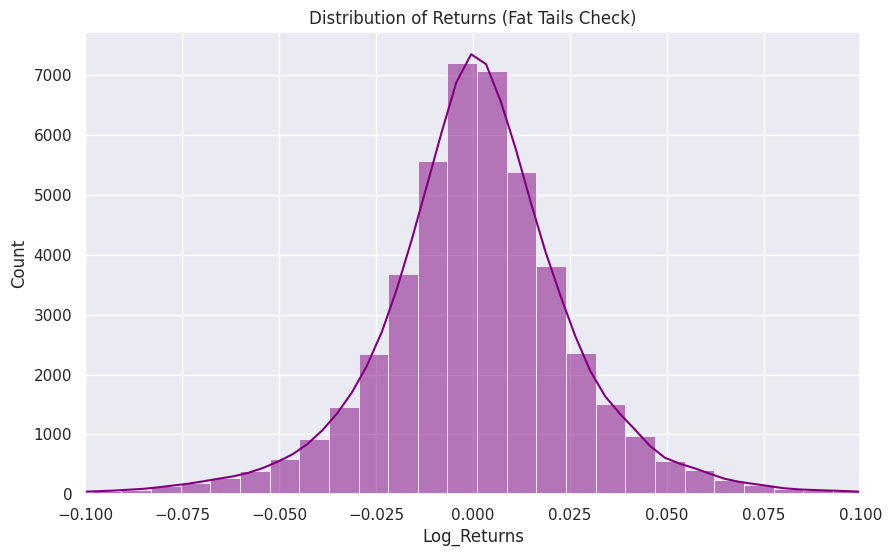

In [24]:
from scipy.stats import f_oneway, ttest_ind, jarque_bera
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. ANOVA Test: Does Industry affect Risk? ---
# H0 (Null Hypothesis): All industries have the same average volatility.
# H1 (Alternative): At least one industry is different.

# Prepare data groups
groups = []
industries = df['Industry'].unique()
for ind in industries:
    groups.append(df[df['Industry'] == ind]['Volatility_20d'].dropna())

# Run ANOVA
stat, p_value = f_oneway(*groups)

print("--- 1. ANOVA Test (Risk by Industry) ---")
print(f"F-Statistic: {stat:.2f}")
print(f"P-Value: {p_value:.10f}")

if p_value < 0.05:
    print("✅ Result: Significant Difference! (Industry determines Risk)")
else:
    print("❌ Result: No Difference found.")


# --- 2. T-Test: AI Chips vs. Nuclear Energy Returns ---
# Compares the mean daily returns of two specific sectors
# Note: Adjust the string names based on your exact 'Industry' values
ai_returns = df[df['Industry'].str.contains('Semiconductor|Chip', case=False, na=False)]['Log_Returns'].dropna()
nuc_returns = df[df['Industry'].str.contains('Nuclear|Utility', case=False, na=False)]['Log_Returns'].dropna()

t_stat, t_p_val = ttest_ind(ai_returns, nuc_returns, equal_var=False)

print("\n--- 2. T-Test (AI vs Nuclear Returns) ---")
print(f"Avg Daily AI Return:      {ai_returns.mean():.4f}%")
print(f"Avg Daily Nuclear Return: {nuc_returns.mean():.4f}%")
print(f"P-Value: {t_p_val:.4f}")

if t_p_val < 0.05:
    print("✅ Result: The difference in returns is Statistically Significant.")
else:
    print("❌ Result: The difference could be random chance.")


# --- 3. Normality Test (Jarque-Bera) ---
# Financial models often assume 'Normal Distribution' (Bell Curve).
# If p-value < 0.05, the data is NOT normal (it has "Fat Tails" -> Black Swan events are more likely).

jb_stat, jb_p_val = jarque_bera(df['Log_Returns'].dropna())

print("\n--- 3. Jarque-Bera Test (Normality) ---")
print(f"P-Value: {jb_p_val:.10f}")
if jb_p_val < 0.05:
    print("⚠️ Insight: Data is NOT Normal. (Contains 'Fat Tails' / Extreme Risks).")
    print("   Recommendation: Use advanced risk models (like VaR), not simple standard deviation.")
else:
    print("✅ Insight: Data looks Normal.")

# Visual Confirmation
plt.figure(figsize=(10, 6))
sns.histplot(df['Log_Returns'], kde=True, bins=100, color='purple')
plt.title('Distribution of Returns (Fat Tails Check)')
plt.xlim(-0.1, 0.1) # Zoom in on the center
plt.show()

# Feature Engineering

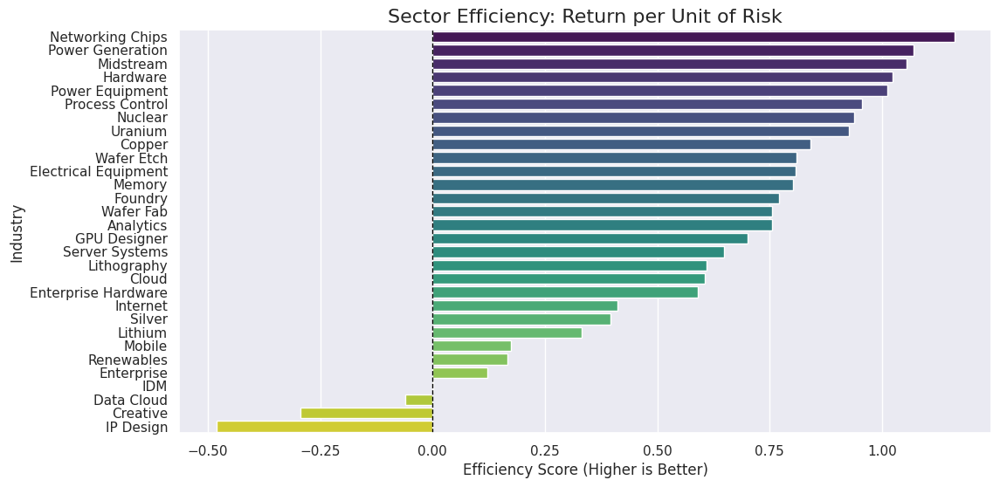

The most efficient sector is **Networking Chips** with a score of 1.16.


In [20]:
# 1. Preparing Data
# Group by Industry (e.g., 'Semiconductors' vs 'Nuclear Energy')
# We calculate the Mean Daily Return and the Mean Volatility
sector_efficiency = df.groupby('Industry').agg({
    'Log_Returns': 'mean',          # Average Daily Growth
    'Volatility_20d': 'mean',       # Average Risk
    'Daily_Turnover': 'mean'        # Size of the market
}).reset_index()

# 2. Creating the "Efficiency Metric" (Risk-Adjusted Return)
# Formula: Annualized Return / Risk
# (Multiplying by 252 to annualize trading days)
sector_efficiency['Efficiency_Score'] = (sector_efficiency['Log_Returns'] * 252) / sector_efficiency['Volatility_20d']

# 3. Visualizing
plt.figure(figsize=(12, 6))
sns.barplot(data=sector_efficiency.sort_values('Efficiency_Score', ascending=False),
            x='Efficiency_Score', y='Industry', palette='viridis')

plt.title('Sector Efficiency: Return per Unit of Risk', fontsize=16)
plt.xlabel('Efficiency Score (Higher is Better)')
plt.ylabel('Industry')
plt.axvline(0, color='black', linestyle='--', linewidth=1)
plt.show()

# Printing the winner
winner = sector_efficiency.sort_values('Efficiency_Score', ascending=False).iloc[0]
print(f"The most efficient sector is **{winner['Industry']}** with a score of {winner['Efficiency_Score']:.2f}.")

# Time-Series Forecasting

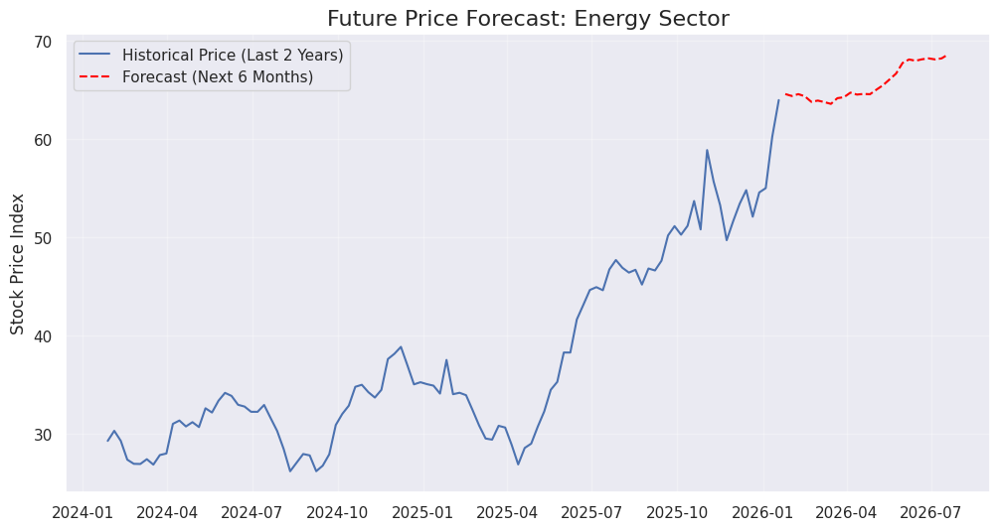

In [21]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# 1. Selecting a Target Sector (e.g., 'Nuclear' or 'Energy' or a specific Ticker like 'NVDA')
# Let's filter for the 'Energy' sector or a proxy. Adjusting string as needed based on your 'Sector' column values.
# If unsure, check: df['Sector'].unique()
target_sector = 'Energy'
sector_data = df[df['Sector'] == target_sector].copy()

# 2. Resampling to Weekly Data (Smoother for forecasting)
# We aggregate by Mean Close price
sector_data['Date'] = pd.to_datetime(sector_data['Date'])
ts_data = sector_data.set_index('Date').resample('W')['Close'].mean().dropna()

# 3. Training the Forecast Model (Holt-Winters)
# This handles trends and seasonality automatically
model = ExponentialSmoothing(ts_data, trend='add', seasonal='add', seasonal_periods=52).fit()

# 4. Predicting the Next 6 Months (26 Weeks)
forecast_steps = 26
forecast = model.forecast(forecast_steps)

# 5. Visualizing
plt.figure(figsize=(12, 6))
plt.plot(ts_data.index[-104:], ts_data.values[-104:], label='Historical Price (Last 2 Years)')
plt.plot(forecast.index, forecast.values, label='Forecast (Next 6 Months)', color='red', linestyle='--')

plt.title(f'Future Price Forecast: {target_sector} Sector', fontsize=16)
plt.ylabel('Stock Price Index')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Interactive Bubble Chart

In [22]:
import plotly.express as px

# 1. Resampling Data for Animation
# Daily data is too heavy for animation. Let's use Monthly Averages.
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.to_period('M').astype(str)

# Aggregate data by Ticker and Month
bubble_data = df.groupby(['Month', 'Ticker', 'Industry', 'Sector']).agg({
    'Volatility_20d': 'mean',
    'Log_Returns': 'sum',          # Total return for the month
    'Daily_Turnover': 'mean',      # Avg daily volume
    'Close': 'last'
}).reset_index()

# 2. Creating the Interactive Plot
fig = px.scatter(bubble_data,
                 x="Volatility_20d",
                 y="Log_Returns",
                 animation_frame="Month",
                 animation_group="Ticker",
                 size="Daily_Turnover",
                 color="Industry",
                 hover_name="Ticker",
                 range_x=[0, bubble_data['Volatility_20d'].max()],
                 range_y=[bubble_data['Log_Returns'].min(), bubble_data['Log_Returns'].max()],
                 title="Evolution of AI & Energy Stocks (Risk vs. Return)",
                 template="plotly_dark")

# 3. Enhancing Labels
fig.update_layout(xaxis_title="Risk (Volatility)", yaxis_title="Monthly Return")
fig.show()

# Univariate Analysis

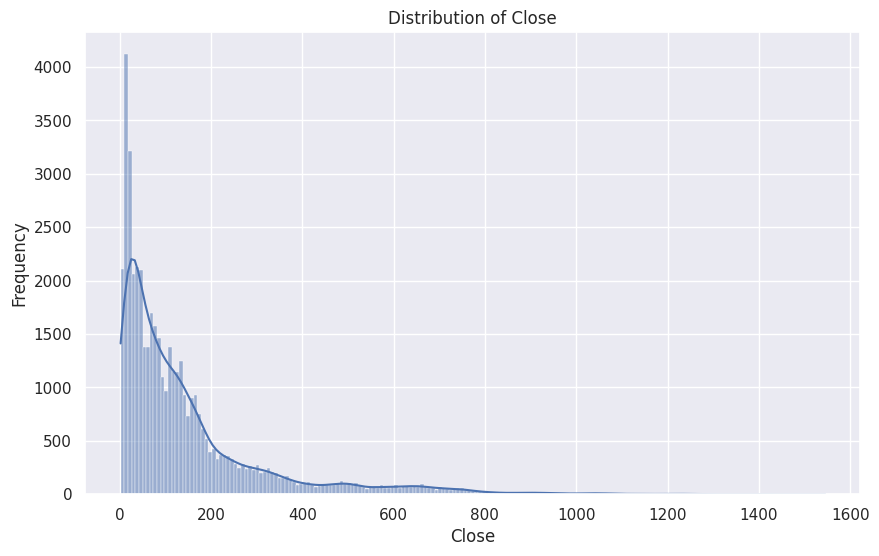

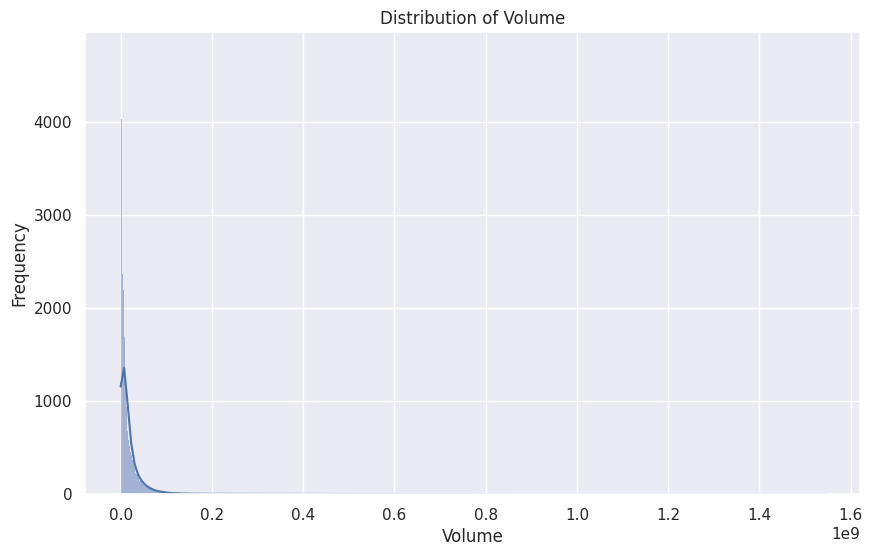

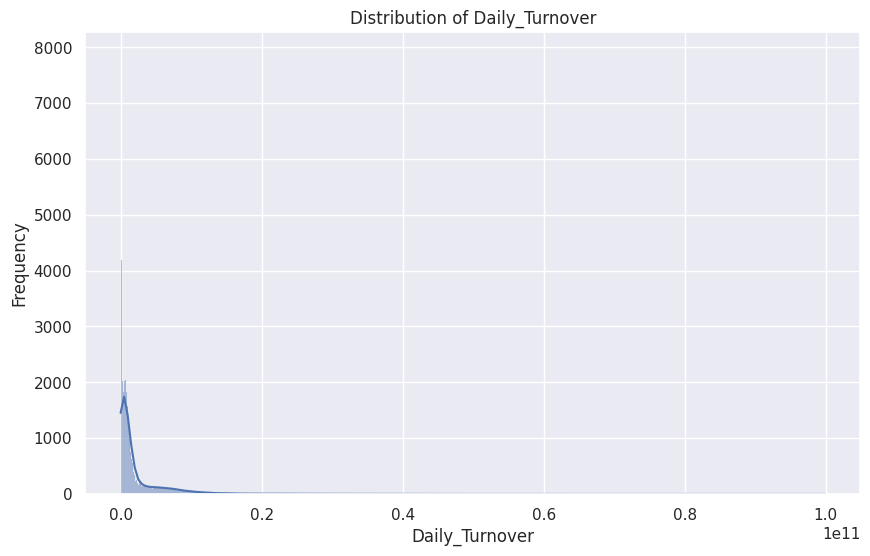

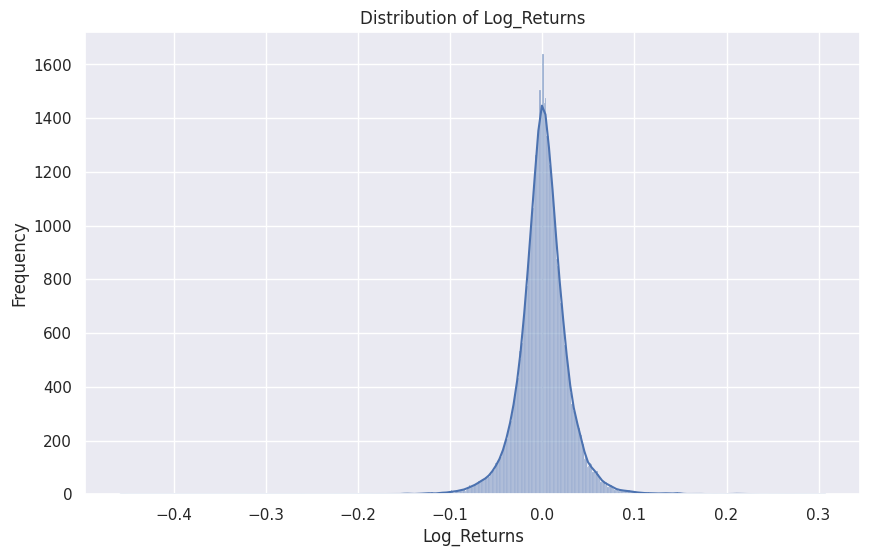

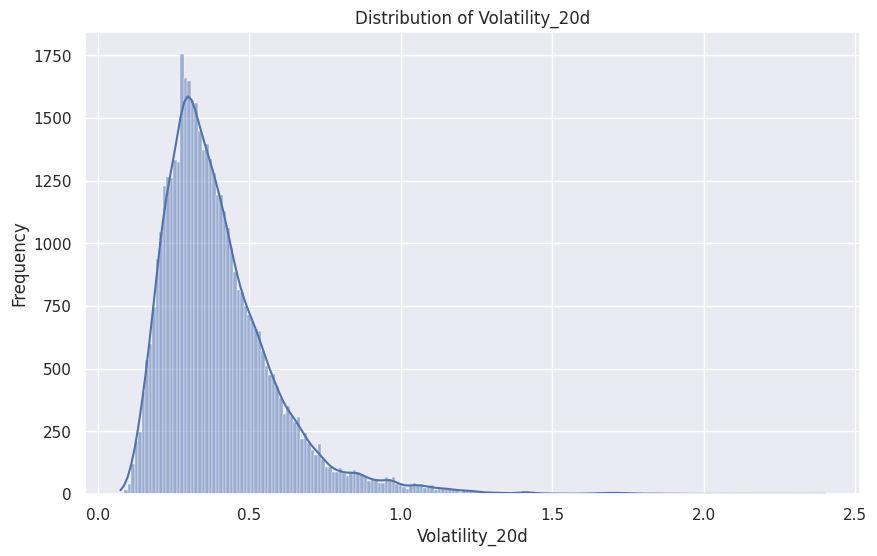

...

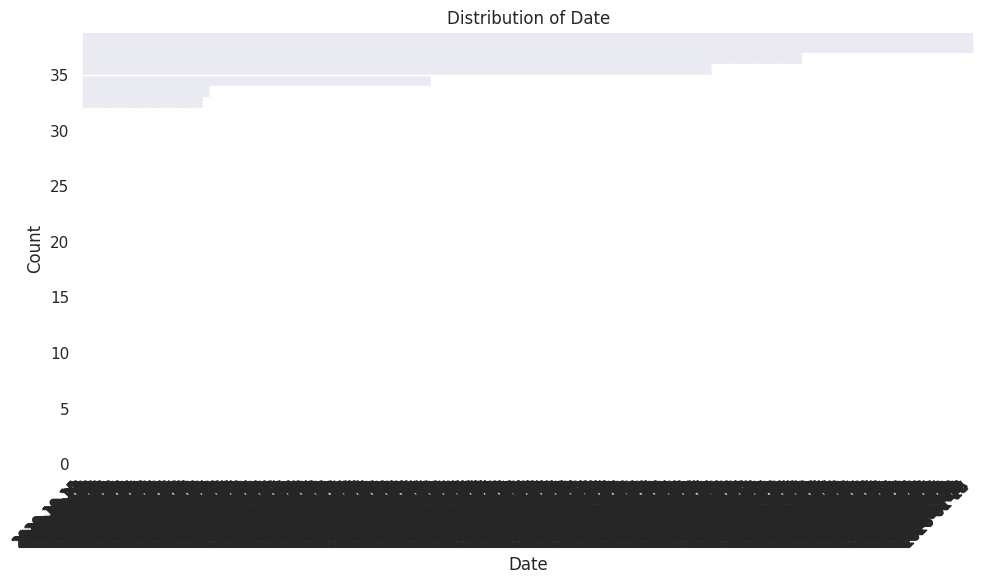

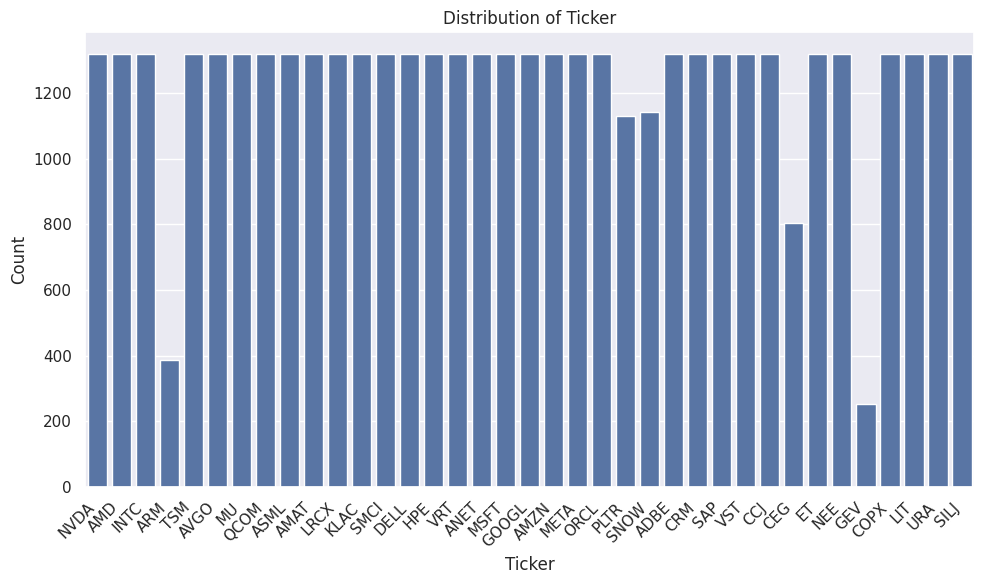

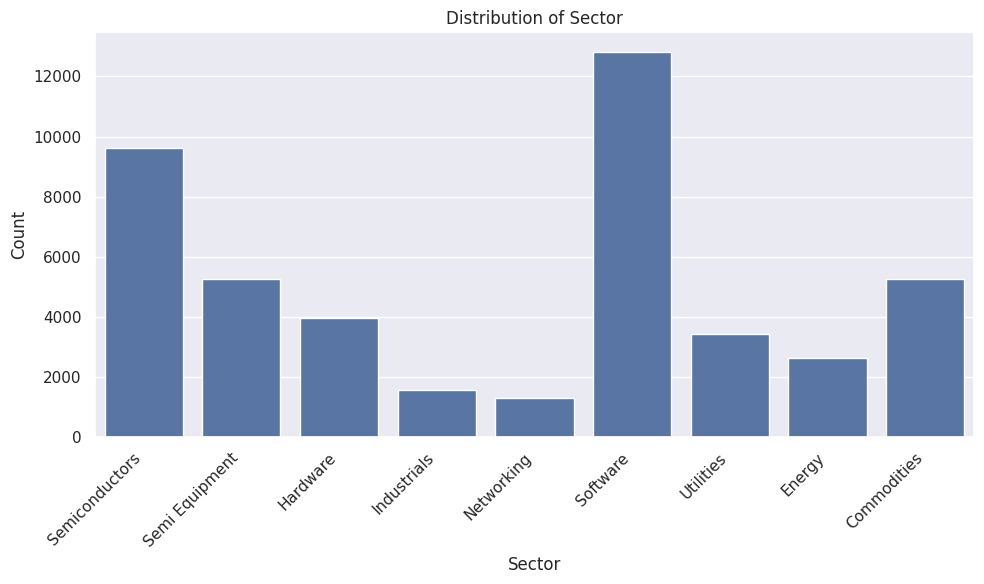

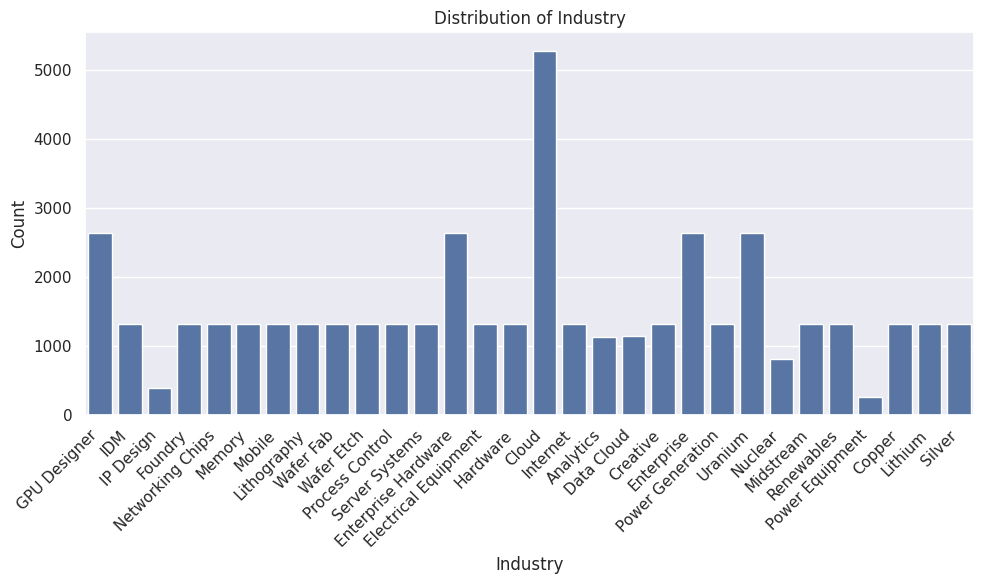

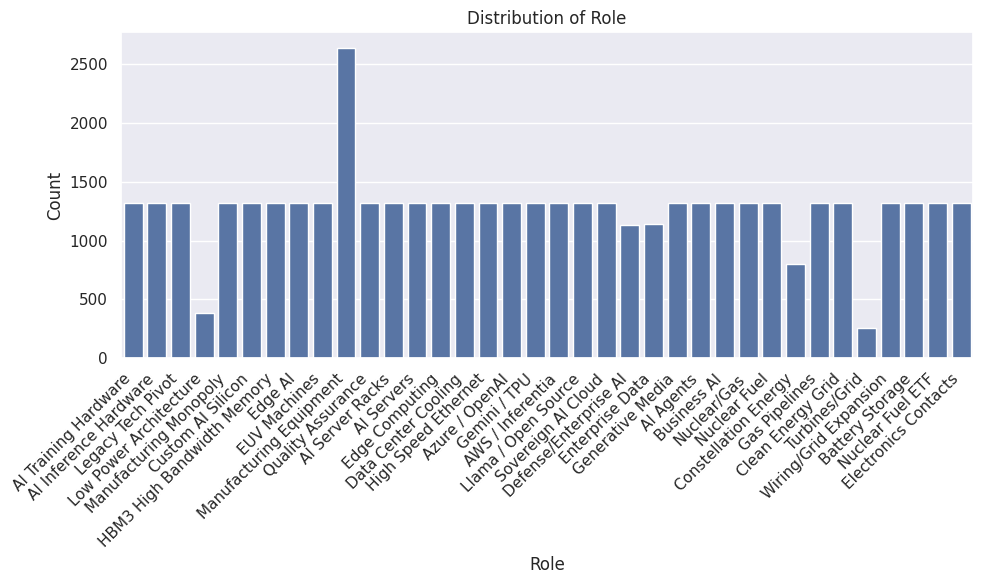

Value counts for Date:
Date
2025-12-18    37
2026-01-15    37
2026-01-14    37
2025-01-13    37
2025-01-14    37
              ..
2020-12-28    32
2020-12-04    32
2020-10-19    32
2020-10-16    32
2020-10-15    32
Name: count, Length: 1319, dtype: int64

Value counts for Ticker:
Ticker
NVDA     1319
AMD      1319
INTC     1319
TSM      1319
AVGO     1319
ORCL     1319
MU       1319
QCOM     1319
ASML     1319
AMAT     1319
LRCX     1319
KLAC     1319
SMCI     1319
DELL     1319
HPE      1319
VRT      1319
ANET     1319
MSFT     1319
GOOGL    1319
AMZN     1319
META     1319
URA      1319
ADBE     1319
SAP      1319
CRM      1319
VST      1319
CCJ      1319
NEE      1319
ET       1319
LIT      1319
SILJ     1319
COPX     1319
SNOW     1141
PLTR     1131
CEG       803
ARM       388
GEV       254
Name: count, dtype: int64

Value counts for Sector:
Sector
Software          12824
Semiconductors     9621
Semi Equipment     5276
Commodities        5276
Hardware           3957
Utilities      

In [10]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

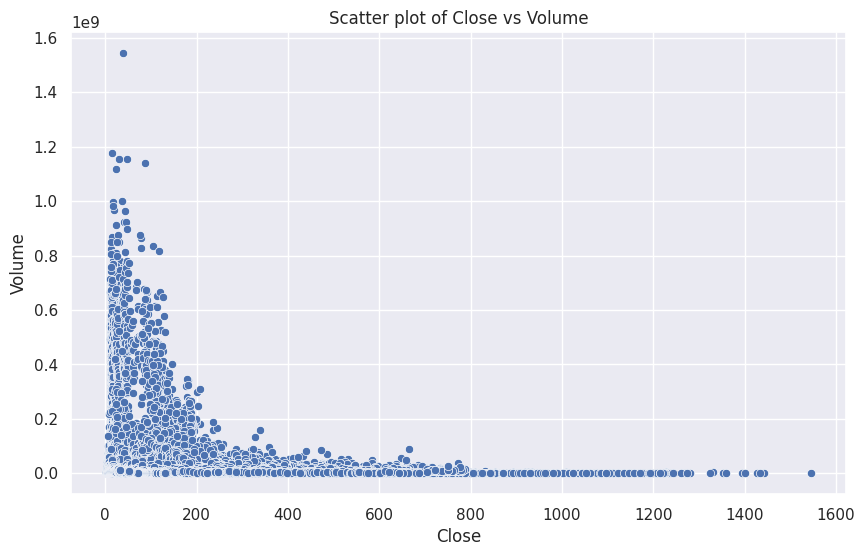

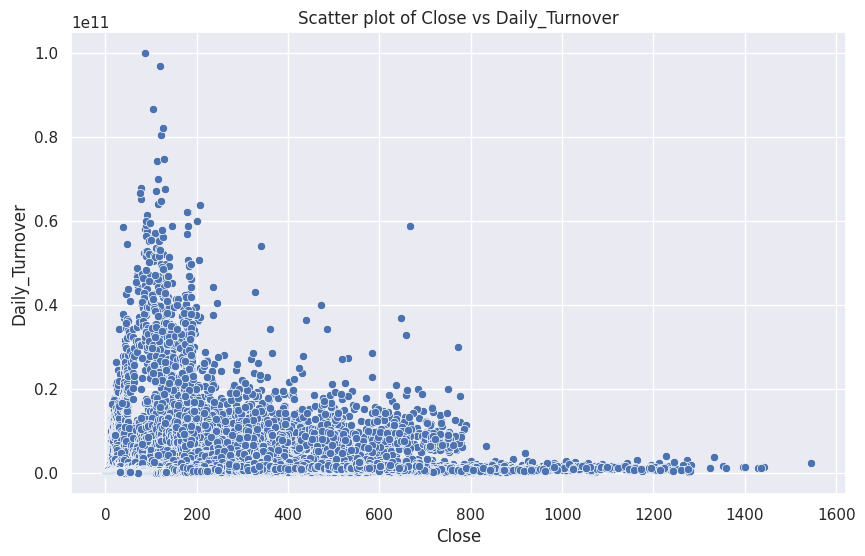

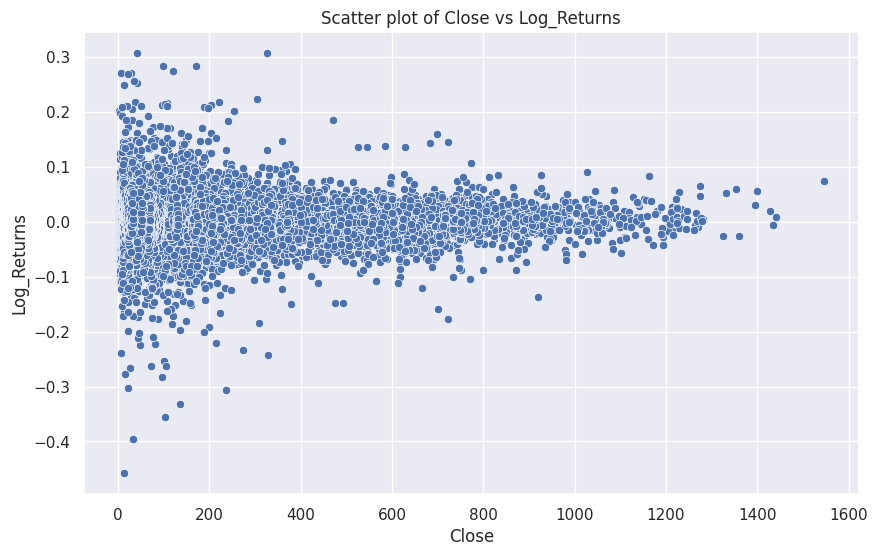

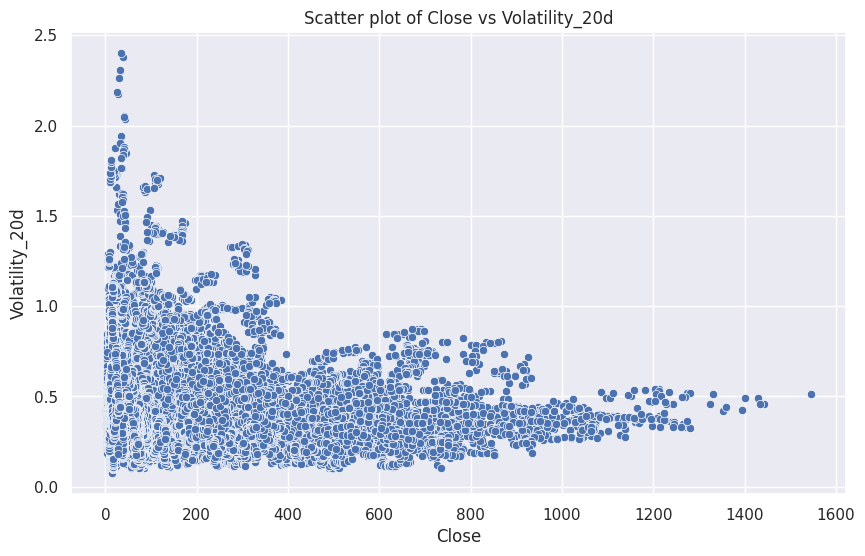

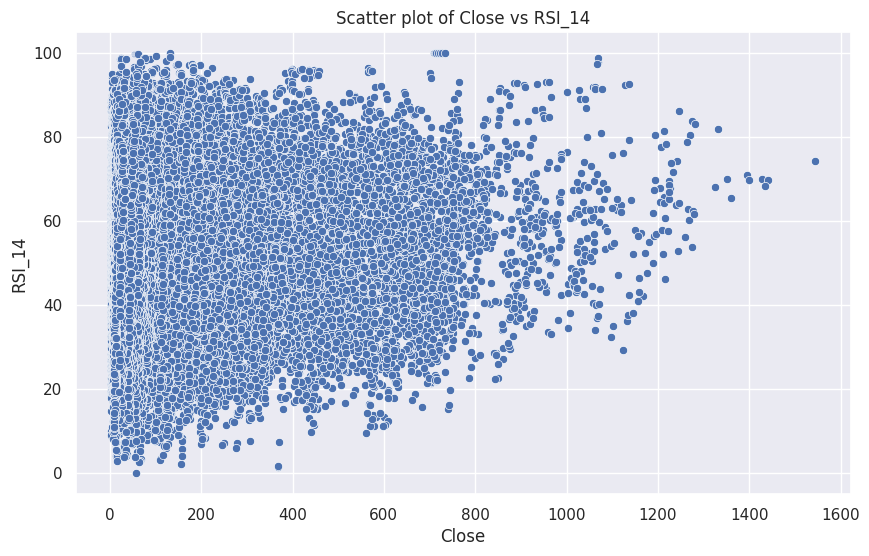

...

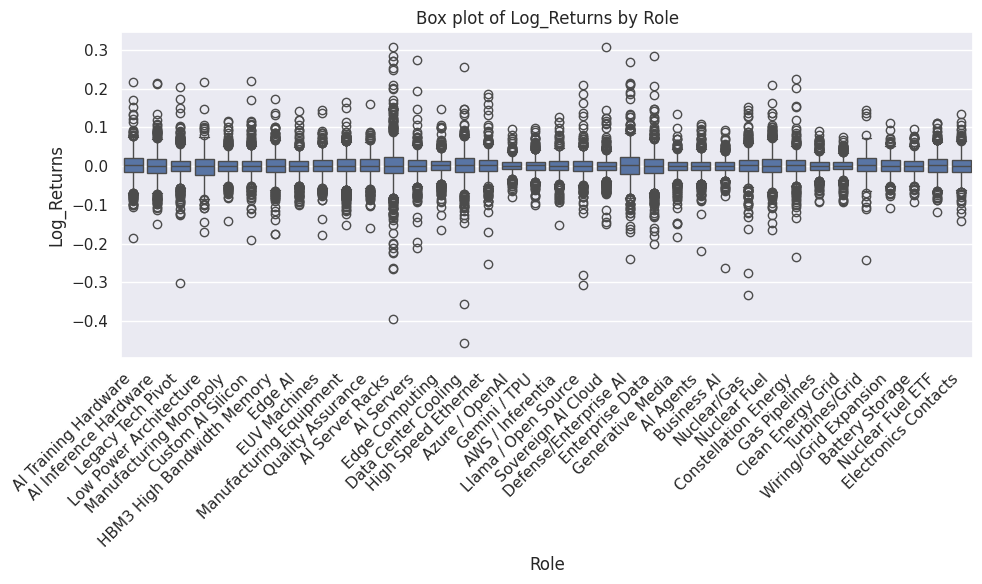

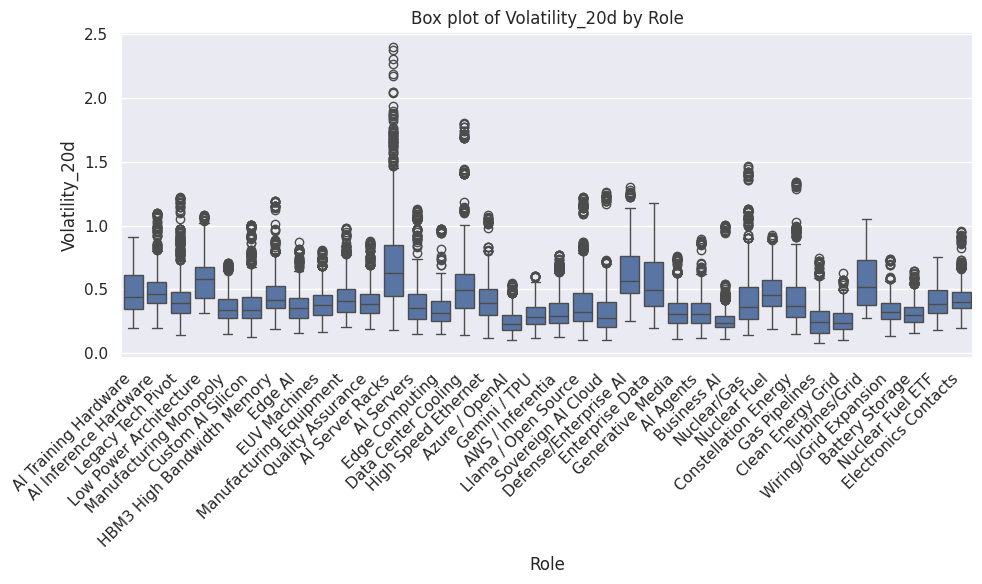

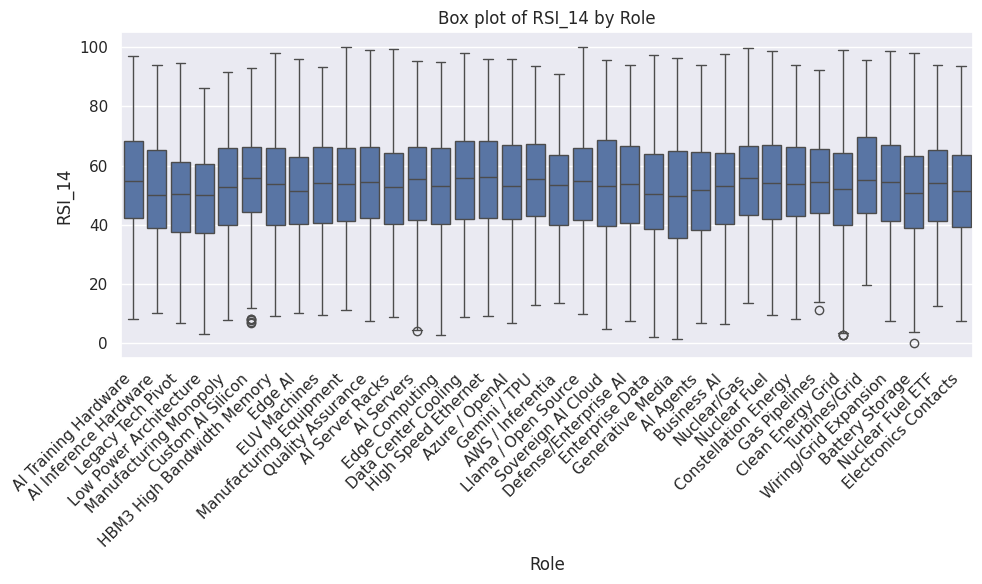

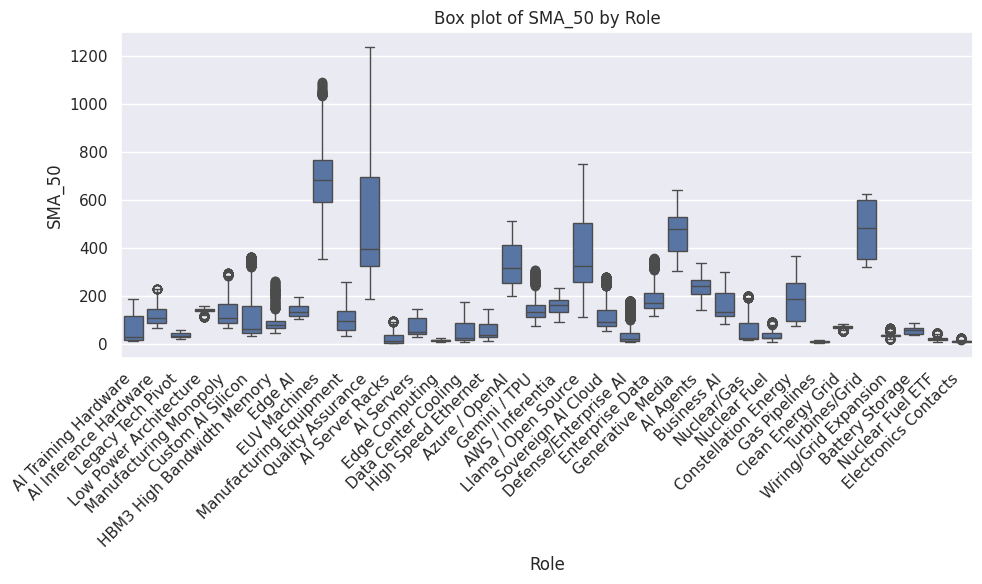

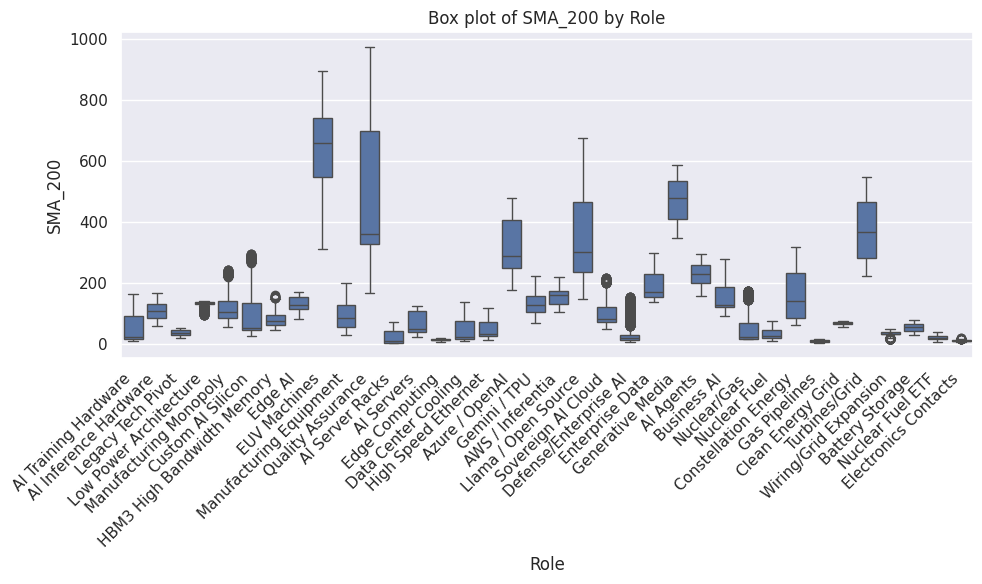

In [11]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

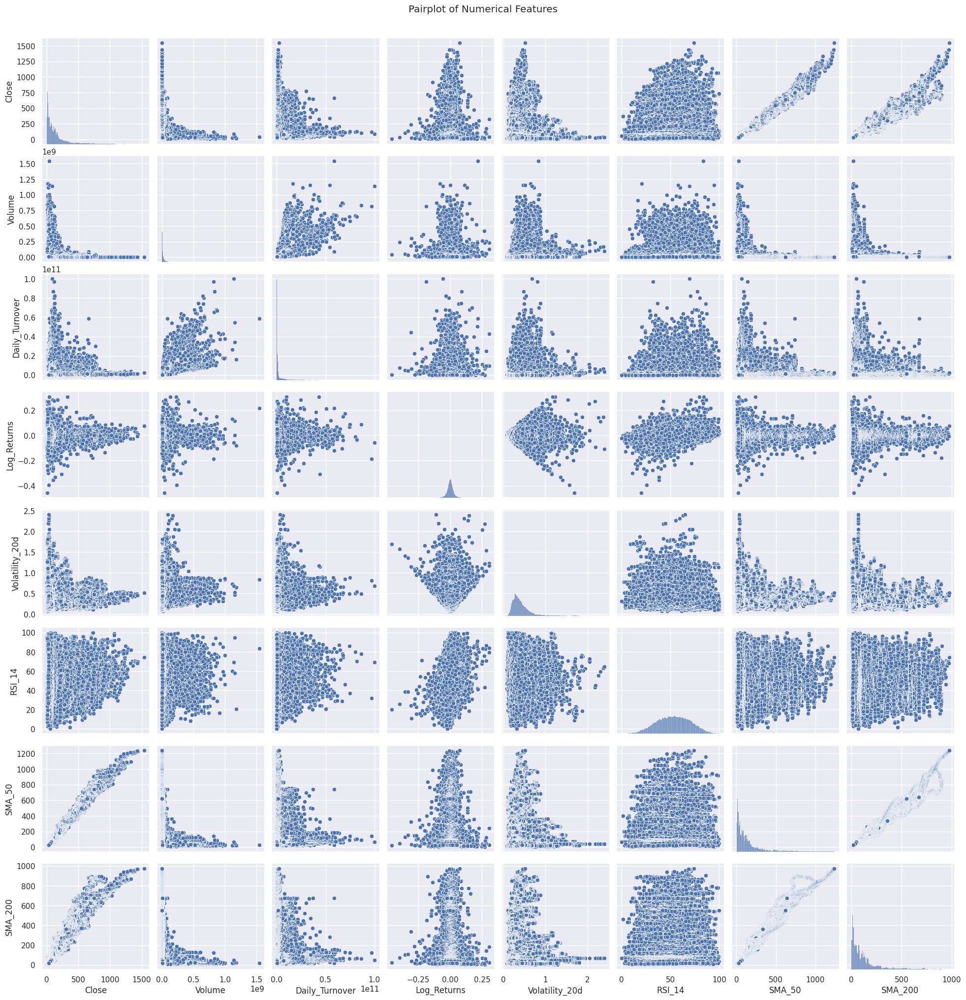

In [12]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

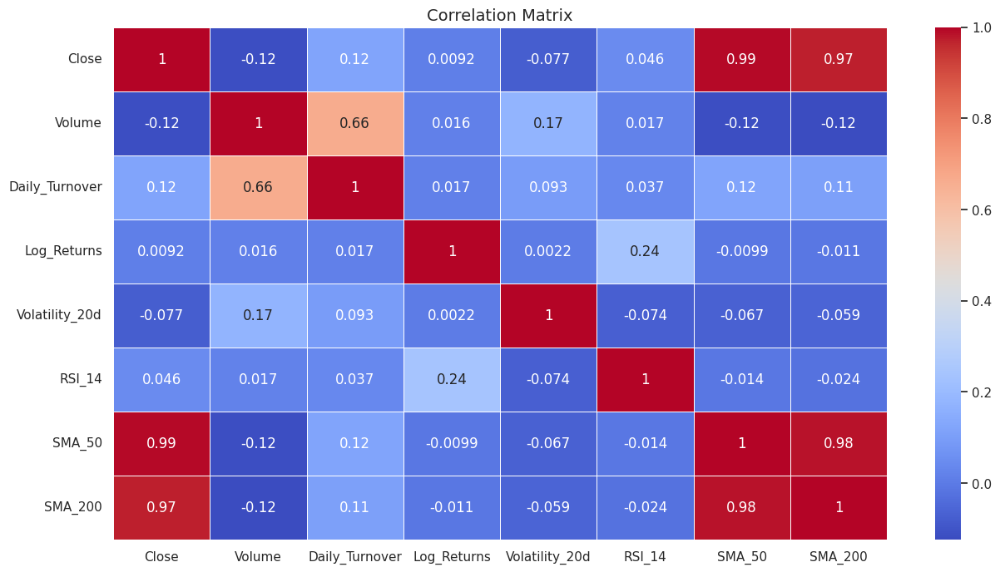

In [13]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Efficient Frontier

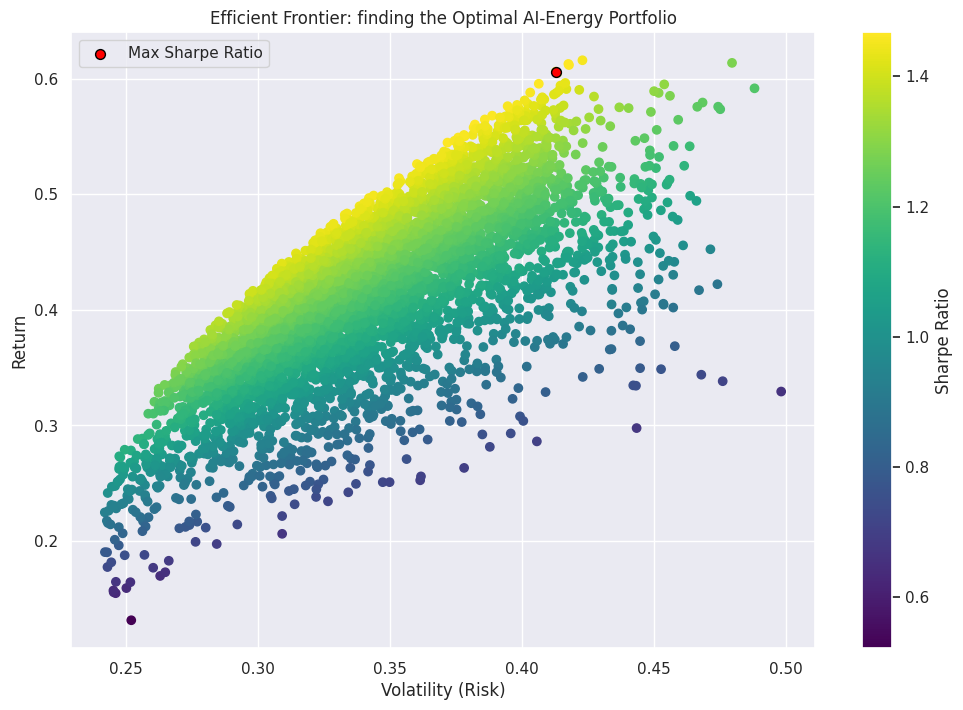

Optimal Weights:
NVDA: 0.1%
AMD: 43.8%
CCJ: 2.2%
NEE: 53.9%


In [23]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Prepare Data (Daily Returns for selected Tickers)
# Let's pick a few representative tickers from different sectors
tickers = ['NVDA', 'AMD', 'CCJ', 'NEE'] # Example: AI, AI, Nuclear, Energy
# Note: You need to filter your 'df' to get pivot data for these tickers
# Creating a pivot table of Close prices
pivot_df = df[df['Ticker'].isin(tickers)].pivot(index='Date', columns='Ticker', values='Close')
returns = pivot_df.pct_change()

# 2. Simulation (Monte Carlo)
num_portfolios = 5000
all_weights = np.zeros((num_portfolios, len(tickers)))
ret_arr = np.zeros(num_portfolios)
vol_arr = np.zeros(num_portfolios)
sharpe_arr = np.zeros(num_portfolios)

for i in range(num_portfolios):
    # Random Weights
    weights = np.array(np.random.random(len(tickers)))
    weights = weights / np.sum(weights) # Normalize to sum to 1
    all_weights[i,:] = weights

    # Expected Return & Volatility
    ret_arr[i] = np.sum(returns.mean() * weights * 252)
    vol_arr[i] = np.sqrt(np.dot(weights.T, np.dot(returns.cov() * 252, weights)))
    sharpe_arr[i] = ret_arr[i] / vol_arr[i]

# 3. Plot Efficient Frontier
plt.figure(figsize=(12, 8))
plt.scatter(vol_arr, ret_arr, c=sharpe_arr, cmap='viridis')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility (Risk)')
plt.ylabel('Return')
plt.title('Efficient Frontier: finding the Optimal AI-Energy Portfolio')

# Mark the Best Portfolio
max_sr_idx = sharpe_arr.argmax()
plt.scatter(vol_arr[max_sr_idx], ret_arr[max_sr_idx], c='red', s=50, edgecolors='black', label='Max Sharpe Ratio')
plt.legend()
plt.show()

print("Optimal Weights:")
for ticker, weight in zip(tickers, all_weights[max_sr_idx]):
    print(f"{ticker}: {weight:.1%}")

# Machine Learning

In [30]:
# 1. Load Data (if not already loaded)
# df = pd.read_csv('AI_Economy_Complete_Index.csv')

# 2. Create the Target Variable
# Logic: If Tomorrow's Close > Today's Close, Target = 1 (Buy/Green Day), else 0 (Sell/Red Day)
# We group by 'Ticker' so we don't compare NVDA's price to the next row which might be a different stock.
df['Target'] = df.groupby('Ticker')['Close'].shift(-1) > df['Close']
df['Target'] = df['Target'].astype(int)

# 3. Select Features (The Signals)
# We use the technical indicators already in the dataset
features = ['RSI_14', 'Volatility_20d', 'Log_Returns', 'SMA_50', 'SMA_200']

# 4. Clean Data
# Drop NaNs created by the shift (last row of each ticker has no "tomorrow")
df_ml = df.dropna(subset=features + ['Target']).copy()

# Optional: Filter for just ONE industry to make it easier to learn first (e.g., 'Semiconductors')
# df_ml = df_ml[df_ml['Industry'] == 'Semiconductors']

# Define X (Features) and y (Target)
X = df_ml[features]
y = df_ml['Target']

# 5. Split Data
# Shuffle=False is important for time-series if we were doing strictly one stock,
# but for a multi-ticker dataset, a random split is okay for a general "pattern recognition" model.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training Data Shape: {X_train.shape}")
print(f"Testing Data Shape:  {X_test.shape}")

Training Data Shape: (36740, 5)
Testing Data Shape:  (9185, 5)


--- Model Accuracy ---
Accuracy: 51.06%

--- Detailed Report ---
              precision    recall  f1-score   support

           0       0.48      0.44      0.46      4373
           1       0.53      0.58      0.55      4812

    accuracy                           0.51      9185
   macro avg       0.51      0.51      0.51      9185
weighted avg       0.51      0.51      0.51      9185



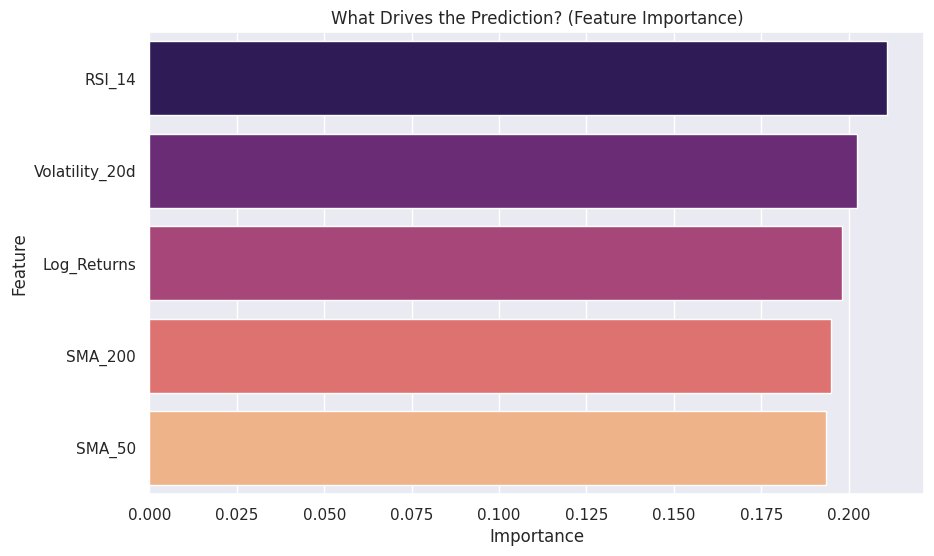

In [31]:
# 1. Initialize and Train
# n_estimators=100 means we use 100 decision trees voting together
model = RandomForestClassifier(n_estimators=100, min_samples_split=10, random_state=42)
model.fit(X_train, y_train)

# 2. Make Predictions
predictions = model.predict(X_test)

# 3. Evaluate Performance
print("--- Model Accuracy ---")
acc = accuracy_score(y_test, predictions)
print(f"Accuracy: {acc:.2%}") # > 50% is a start, > 55% is actually good in finance!

print("\n--- Detailed Report ---")
print(classification_report(y_test, predictions))

# 4. Feature Importance (What matters most?)
importance = pd.DataFrame({'Feature': features, 'Importance': model.feature_importances_})
importance = importance.sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=importance, x='Importance', y='Feature', palette='magma')
plt.title('What Drives the Prediction? (Feature Importance)')
plt.show()

# Thank You